Sean Connin<br>
Data 608 Module 2 - Big Data<br>
September 26, 2021

In [30]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [36]:
try:
  import IPython
except ImportError:
  !pip install IPython
  import IPython

try:
  import pyproj
except ImportError:
  !pip install pyproj
  import pyproj

try:
  import datashader as ds
except ImportError:
  !pip install datashader
  import datashader as ds

from IPython.display import HTML

import datashader.transfer_functions as tf
import datashader.glyphs
from datashader import reductions
from datashader.core import bypixel
from datashader.utils import lnglat_to_meters as webm, export_image
from datashader.colors import colormap_select, Greys9, viridis, inferno
import copy

from pyproj import Proj, transform
import numpy as np
import pandas as pd
import urllib
import json
import datetime
import colorlover as cl

import plotly.express as px
import plotly.offline as py
import plotly.graph_objs as go
###
import plotly.graph_objects as go
###
from plotly import tools
from plotly.offline import iplot
from functools import partial

#from IPython.display import GeoJSON


In [32]:
ny = pd.read_csv('/content/drive/MyDrive/Colab Data Files/pluto_21v2.csv')

In [33]:
# Code to read in v17, column names have been updated (without upper case letters) for v18

# bk = pd.read_csv('PLUTO17v1.1/BK2017V11.csv')
# bx = pd.read_csv('PLUTO17v1.1/BX2017V11.csv')
# mn = pd.read_csv('PLUTO17v1.1/MN2017V11.csv')
# qn = pd.read_csv('PLUTO17v1.1/QN2017V11.csv')
# si = pd.read_csv('PLUTO17v1.1/SI2017V11.csv')

# ny = pd.concat([bk, bx, mn, qn, si], ignore_index=True)

#ny = pd.read_csv('pluto_21v2.csv')

#nyc_pluto_21v2_csv/

# Getting rid of some outliers

ny = ny[(ny['yearbuilt'] > 1850) & (ny['yearbuilt'] < 2020) & (ny['numfloors'] != 0)]


For module 2 we'll be looking at techniques for dealing with big data. In particular binning strategies and the datashader library (which possibly proves we'll never need to bin large data for visualization ever again.)

To demonstrate these concepts we'll be looking at the PLUTO dataset put out by New York City's department of city planning. PLUTO contains data about every tax lot in New York City.

PLUTO data can be downloaded from [here](https://www1.nyc.gov/site/planning/data-maps/open-data/dwn-pluto-mappluto.page). Unzip them to the same directory as this notebook, and you should be able to read them in using this (or very similar) code. Also take note of the data dictionary, it'll come in handy for this assignment.

I'll also do some prep for the geographic component of this data, which we'll be relying on for datashader.

You're not required to know how I'm retrieving the lattitude and longitude here, but for those interested: this dataset uses a flat x-y projection (assuming for a small enough area that the world is flat for easier calculations), and this needs to be projected back to traditional lattitude and longitude.

In [34]:
#wgs84 = Proj("+proj=longlat +ellps=GRS80 +datum=NAD83 +no_defs")
 
#nyli = Proj("+proj=lcc +lat_1=40.66666666666666 +lat_2=41.03333333333333 +lat_0=40.16666666666666 +lon_0=-74 +x_0=300000 +y_0=0 +ellps=GRS80 +datum=NAD83 +to_meter=0.3048006096012192 +no_defs")
#ny['xcoord'] = 0.3048*ny['xcoord']
#ny['ycoord'] = 0.3048*ny['ycoord']
#ny['lon'], ny['lat'] = transform(nyli, wgs84, ny['xcoord'].values, ny['ycoord'].values)

#ny = ny[(ny['lon'] < -60) & (ny['lon'] > -100) & (ny['lat'] < 60) & (ny['lat'] > 20)]

#Defining some helper functions for DataShader

background = "black"
export = partial(export_image, background = background, export_path="export")
cm = partial(colormap_select, reverse=(background!="black"))

## Part 1: Binning and Aggregation

Binning is a common strategy for visualizing large datasets. Binning is inherent to a few types of visualizations, such as histograms and [2D histograms](https://plot.ly/python/2D-Histogram/) (also check out their close relatives: [2D density plots](https://plot.ly/python/2d-density-plots/) and the more general form: [heatmaps](https://plot.ly/python/heatmaps/).

While these visualization types explicitly include binning, any type of visualization used with aggregated data can be looked at in the same way. For example, lets say we wanted to look at building construction over time. This would be best viewed as a line graph, but we can still think of our results as being binned by year:

In [38]:
trace = go.Scatter(
    # I'm choosing BBL here because I know it's a unique key.
    x = ny.groupby('yearbuilt').count()['bbl'].index,
    y = ny.groupby('yearbuilt').count()['bbl']
)

layout = go.Layout(
    xaxis = dict(title = 'Year Built'),
    yaxis = dict(title = 'Number of Lots Built')
)

fig = go.FigureWidget(data = [trace], layout = layout)

fig.show(renderer="colab")  # add renderer="colab" in order to produce graph

Something looks off... You're going to have to deal with this imperfect data to answer this first question. 

But first: some notes on pandas. Pandas dataframes are a different beast than R dataframes, here are some tips to help you get up to speed:

---

Hello all, here are some pandas tips to help you guys through this homework:

[Indexing and Selecting](https://pandas.pydata.org/pandas-docs/stable/indexing.html): .loc and .iloc are the analogs for base R subsetting, or filter() in dplyr

[Group By](https://pandas.pydata.org/pandas-docs/stable/groupby.html):  This is the pandas analog to group_by() and the appended function the analog to summarize(). Try out a few examples of this, and display the results in Jupyter. Take note of what's happening to the indexes, you'll notice that they'll become hierarchical. I personally find this more of a burden than a help, and this sort of hierarchical indexing leads to a fundamentally different experience compared to R dataframes. Once you perform an aggregation, try running the resulting hierarchical datafrome through a [reset_index()](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.reset_index.html).

[Reset_index](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.reset_index.html): I personally find the hierarchical indexes more of a burden than a help, and this sort of hierarchical indexing leads to a fundamentally different experience compared to R dataframes. reset_index() is a way of restoring a dataframe to a flatter index style. Grouping is where you'll notice it the most, but it's also useful when you filter data, and in a few other split-apply-combine workflows. With pandas indexes are more meaningful, so use this if you start getting unexpected results.

Indexes are more important in Pandas than in R. If you delve deeper into the using python for data science, you'll begin to see the benefits in many places (despite the personal gripes I highlighted above.) One place these indexes come in handy is with time series data. The pandas docs have a [huge section](http://pandas.pydata.org/pandas-docs/stable/timeseries.html) on datetime indexing. In particular, check out [resample](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.resample.html), which provides time series specific aggregation.

[Merging, joining, and concatenation](https://pandas.pydata.org/pandas-docs/stable/merging.html): There's some overlap between these different types of merges, so use this as your guide. Concat is a single function that replaces cbind and rbind in R, and the results are driven by the indexes. Read through these examples to get a feel on how these are performed, but you will have to manage your indexes when you're using these functions. Merges are fairly similar to merges in R, similarly mapping to SQL joins.

Apply: This is explained in the "group by" section linked above. These are your analogs to the plyr library in R. Take note of the lambda syntax used here, these are anonymous functions in python. Rather than predefining a custom function, you can just define it inline using lambda.

Browse through the other sections for some other specifics, in particular reshaping and categorical data (pandas' answer to factors.) Pandas can take a while to get used to, but it is a pretty strong framework that makes more advanced functions easier once you get used to it. Rolling functions for example follow logically from the apply workflow (and led to the best google results ever when I first tried to find this out and googled "pandas rolling")

Google Wes Mckinney's book "Python for Data Analysis," which is a cookbook style intro to pandas. It's an O'Reilly book that should be pretty available out there.

---

### Question

After a few building collapses, the City of New York is going to begin investigating older buildings for safety. The city is particularly worried about buildings that were unusually tall when they were built, since best-practices for safety hadn’t yet been determined. Create a graph that shows how many buildings of a certain number of floors were built in each year (note: you may want to use a log scale for the number of buildings). Find a strategy to bin buildings (It should be clear 20-29-story buildings, 30-39-story buildings, and 40-49-story buildings were first built in large numbers, but does it make sense to continue in this way as you get taller?)

Note - from the previous line graph it appears that parcel data (# of lots built) were entered into the database at intervals 
rather than continuously. As a result, it may be best to bin our data based on temporal intervals - e.g., decades. 

First I will compile annual summary statistics for 'numfloors'

In [39]:

import warnings  
warnings.filterwarnings('ignore')

# get ny column names

list(ny)

# look at some summary stats

blg = ny

blg.groupby('yearbuilt')['numfloors'].describe()




,count,mean,std,min,25%,50%,75%,max
yearbuilt,,,,,,,,
1851.0,89.0,3.561798,0.979391,2.0,3.0,3.0,4.00,7.0
1852.0,209.0,3.452153,0.789113,1.0,3.0,3.0,4.00,6.0
1853.0,246.0,3.345528,0.909149,2.0,3.0,3.0,4.00,11.0
1854.0,239.0,3.678870,0.943890,1.0,3.0,3.0,4.00,7.0
1855.0,268.0,3.449627,0.750954,2.0,3.0,3.0,4.00,6.0
...,...,...,...,...,...,...,...,...
2015.0,1722.0,4.812700,7.410837,1.0,2.0,3.0,4.00,73.0
2016.0,1705.0,4.366804,5.586410,1.0,2.0,3.0,4.00,71.0
2017.0,1870.0,4.389567,5.630455,0.2,2.0,3.0,4.25,64.0


Now I will bin 'numfloors' into discrete ranges and aggregate by decade.

In [40]:
#create data set with bins that will be used for graphing

#subset columns for analyses

blg = ny[['yearbuilt', 'numfloors']].astype(int)

# floornum counts by year using size()

cnt_size=blg.groupby(['yearbuilt', 'numfloors']).size()

# aggregate years into decades for subsequent graphics. See note in previous cell for explanation. 

blg["decade"] = (blg['yearbuilt'] // 10 * 10 ).astype(int) 

# create our floornum bins and save counts in new datframe

bin = (1, 2, 3, 4, 5, 10, 20 , 40, 80, 110)  

cut = pd.cut(blg['numfloors'], bin)

dec_cnt=blg.groupby(['decade', cut]).agg(['count']).reset_index()

dec_cnt.drop(dec_cnt.columns[3], axis=1, inplace=True)

dec_cnt.columns = dec_cnt.columns.get_level_values(0) # flatten the column name hierarchy following agg

dec_cnt = dec_cnt.rename({"yearbuilt": 'count'}, axis=1) 

dec_cnt.head(10)


,decade,numfloors,count
0,1850,"(1, 2]",91
1,1850,"(2, 3]",854
2,1850,"(3, 4]",377
3,1850,"(4, 5]",177
4,1850,"(5, 10]",49
5,1850,"(10, 20]",1
6,1850,"(20, 40]",0
7,1850,"(40, 80]",0
8,1850,"(80, 110]",0
9,1860,"(1, 2]",112


These tranformations are represented in the following stacked bar charts. Note that the count categories for number-of-floors are represented on a log scale. 

Also note that I have produced the same graph using ploty express and plotly for the purpose of code comparison.

In [106]:
# Build data graphis to show how many buildings of a certain number of floors were built in each year

#import plotly.graph_objects as go 

# as a first slice create a stacked bar chart with plotly express - for those of us with grey hair!
    
import plotly.express as px  
fig = px.bar(dec_cnt, x='decade', y='count', barmode='stack', color='numfloors', 
             title = 'Counts of NYC Buildings Grouped by Height and Decade of Completion<br><sup>Height Represented by Number of Floors</sup>')
fig.layout.legend.traceorder = 'reversed'
fig.show(renderer="colab")

# create stacked bar chart with plotly

groups = dec_cnt.groupby('numfloors') 
fig = go.Figure()
for g in groups.groups:
    group = groups.get_group(g)
    fig.add_trace(go.Bar(x=group['decade'], y=group['count'], name=str(g))) 
fig.update_layout(barmode='stack', xaxis={'categoryorder':'category ascending'}) 
fig.show(renderer="colab")




                      

The previous approach doesn't get at the issue of building safety in relation to height (number of floors) and the year in which they were built. 

For this purpose it might be helpful to create a proxy for saftey by aggregating building counts based on the percentile rank of floor numbers. 

The following code groups buildings into three categories of saftey, where:

* unsafe = buildings with num_floors >= the 95 quantile for each year

* moderately safe = buildings with num_floors between the 5-95 quantile exclusive for each year.

* safe = buildings with numfloors <= the 5th quantile for each year


Due to time limitations, I do not prepared a data graphic for the results.

In [45]:
import warnings  
warnings.filterwarnings('ignore') 

# get ny column names

list(ny)

#subset columns for analyses

blg = ny[['yearbuilt', 'numfloors']].astype(int)

#blg["Decade"] = (blg['yearbuilt'] // 10 *10 ).astype(int) 

# review basic summary stats

blg.groupby('yearbuilt').numfloors.describe()

# group floors into quantiles by year

usf=blg[blg.numfloors>=blg.groupby('yearbuilt').numfloors.transform('quantile',0.95)]
mid= blg[(blg.numfloors<blg.groupby('yearbuilt').numfloors.transform('quantile',0.95)) & (blg.numfloors>blg.groupby('yearbuilt').numfloors.transform('quantile',0.50))]
sf = blg[blg.numfloors<=blg.groupby('yearbuilt').numfloors.transform('quantile',0.5)]

usf['usf_min']=usf.groupby('yearbuilt').numfloors.min()
usf['usf_max']=usf.groupby('yearbuilt').numfloors.max()

mid["mid_min"]=mid.groupby('yearbuilt').numfloors.min()
mid["mid_max"]=mid.groupby('yearbuilt').numfloors.max()

sf['sf_min']=sf.groupby('yearbuilt').numfloors.min()
sf['sf_max']=sf.groupby('yearbuilt').numfloors.max()

#count floors in quantile groups & convert to dataframe

usf=usf.groupby('yearbuilt')['numfloors'].count()
usf.to_frame()

mid=mid.groupby('yearbuilt')['numfloors'].count()
mid.to_frame()
    
sf=sf.groupby('yearbuilt')['numfloors'].count()
sf.to_frame()

#merge dataframes and set column names to create dataframe for plotting

x= pd.merge(left=sf, right=mid, how='left', left_on='yearbuilt', right_on='yearbuilt')

yr_per_cnts = pd.merge(left=x, right=usf, how='left', left_on='yearbuilt', right_on='yearbuilt').reset_index()

yr_per_cnts = yr_per_cnts.rename(columns={'yearbuilt': 'Year', 'numfloors_x': 'Safe (< 51 percentile)', 'numfloors_y': 'Moderately_Safe (51-94 percentile)', 'numfloors': 'Unsafe (> 94 percentile)'})

yr_per_cnts.head()





,Year,Safe (< 51 percentile),Moderately_Safe (51-94 percentile),Unsafe (> 94 percentile)
0,1851,54,21.0,14
1,1852,129,61.0,19
2,1853,174,53.0,19
3,1854,129,65.0,45
4,1855,171,70.0,27


## Part 2: Datashader

Datashader is a library from Anaconda that does away with the need for binning data. It takes in all of your datapoints, and based on the canvas and range returns a pixel-by-pixel calculations to come up with the best representation of the data. In short, this completely eliminates the need for binning your data.

As an example, lets continue with our question above and look at a 2D histogram of YearBuilt vs NumFloors:

In [47]:
fig = go.FigureWidget(
    data = [
        go.Histogram2d(x=ny['yearbuilt'], y=ny['numfloors'], autobiny=False, ybins={'size': 1}, colorscale='Greens')
    ]
)

fig.show(renderer="colab")

This shows us the distribution, but it's subject to some biases discussed in the Anaconda notebook [Plotting Perils](https://anaconda.org/jbednar/plotting_pitfalls/notebook). 

Here is what the same plot would look like in datashader:



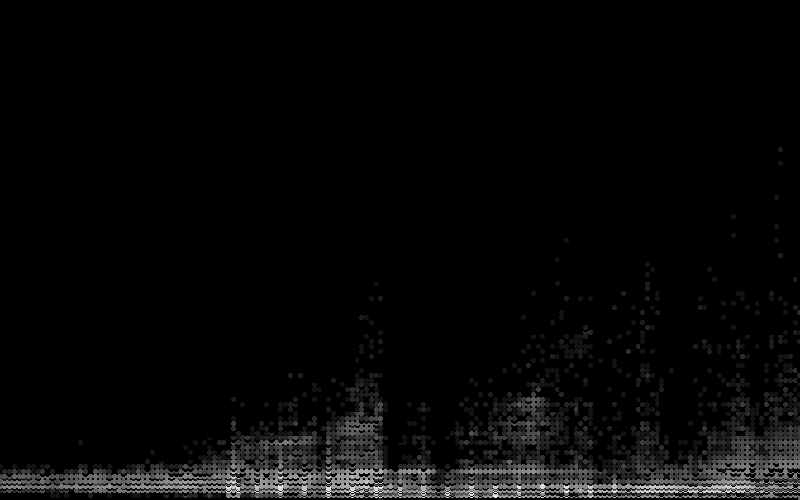

In [48]:
#Defining some helper functions for DataShader

background = "black"
export = partial(export_image, background = background, export_path="export")
cm = partial(colormap_select, reverse=(background!="black"))

# specify canvas

cvs = ds.Canvas(800, 500, x_range = (ny['yearbuilt'].min(), ny['yearbuilt'].max()), 
                                y_range = (ny['numfloors'].min(), ny['numfloors'].max()))

# aggregate data into grid using points. Not sure where Reduction is occuring.....output is Xarray?

agg = cvs.points(ny, 'yearbuilt', 'numfloors')

# create transfer function, maps info using log so that we can see the full range of structure

view = tf.shade(agg, cmap = cm(Greys9), how='log')

# note spread is used to replace each bin with a shape

export(tf.spread(view, px=2), 'yearvsnumfloors')

That's technically just a scatterplot, but the points are smartly placed and colored to mimic what one gets in a heatmap. Based on the pixel size, it will either display individual points, or will color the points of denser regions.

Datashader really shines when looking at geographic information. Here are the latitudes and longitudes of our dataset plotted out, giving us a map of the city colored by density of structures:

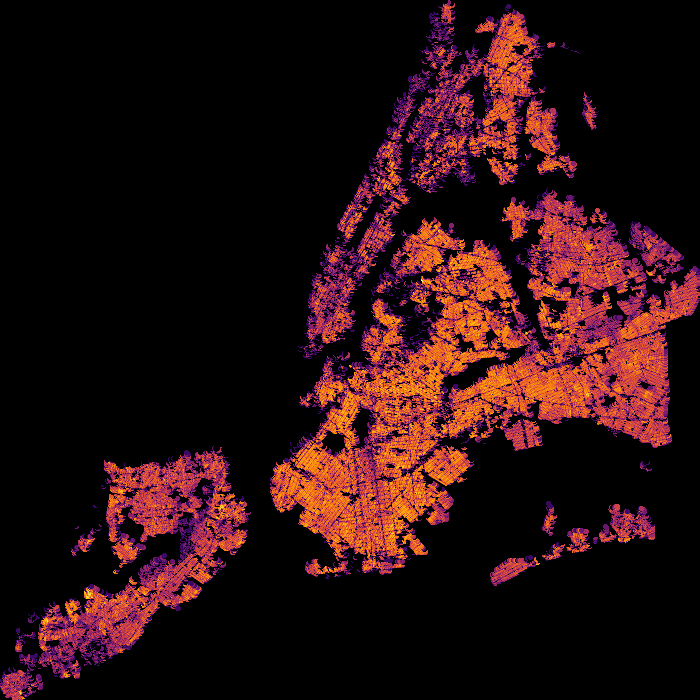

In [49]:
NewYorkCity   = (( 913164.0,  1067279.0), (120966.0, 272275.0))
cvs = ds.Canvas(700, 700, *NewYorkCity)
agg = cvs.points(ny, 'xcoord', 'ycoord')
view = tf.shade(agg, cmap = cm(inferno), how='log')
export(tf.spread(view, px=2),  'firery')

Interestingly, since we're looking at structures, the large buildings of Manhattan show up as less dense on the map. The densest areas measured by number of lots would be single or multi family townhomes.

Unfortunately, Datashader doesn't have the best documentation. Browse through the examples from their [github repo](https://github.com/bokeh/datashader/tree/master/examples). I would focus on the [visualization pipeline](https://anaconda.org/jbednar/pipeline/notebook) and the [US Census](https://anaconda.org/jbednar/census/notebook) Example for the question below. Feel free to use my samples as templates as well when you work on this problem.

### Question

You work for a real estate developer and are researching underbuilt areas of the city. After looking in the [Pluto data dictionary](https://www1.nyc.gov/assets/planning/download/pdf/data-maps/open-data/pluto_datadictionary.pdf?v=17v1_1), you've discovered that all tax assessments consist of two parts: The assessment of the land and assessment of the structure. You reason that there should be a correlation between these two values: more valuable land will have more valuable structures on them (more valuable in this case refers not just to a mansion vs a bungalow, but an apartment tower vs a single family home). Deviations from the norm could represent underbuilt or overbuilt areas of the city. You also recently read a really cool blog post about [bivariate choropleth maps](http://www.joshuastevens.net/cartography/make-a-bivariate-choropleth-map/), and think the technique could be used for this problem.

Datashader is really cool, but it's not that great at labeling your visualization. Don't worry about providing a legend, but provide a quick explanation as to which areas of the city are overbuilt, which areas are underbuilt, and which areas are built in a way that's properly correlated with their land value.

In [81]:


as1 = ny[['xcoord','ycoord','assessland', 'assesstot']]

#any negative values?

as1.lt(0).sum().sum()

#grab summary stats

as1.describe()

# any lots where the total assessed value is > assessed land? No!

as1[as1['assessland'] > as1['assesstot']]

# subset to include lots that have a structure -- we limit our analyses to these sites

#as2 = as1.loc[~(as1['assessland'] != as1['assesstot'])]

as1['temp'] = as1['assesstot']-as1['assessland']

as2=as1.loc[as1['temp'] != 0]

# derived assessed value of structures on lots

as2['assess_struct'] = as2['assesstot']-as2['assessland']

#derive the ratio comparing struct:land assessments as a check on QAQC. 

as2['assess_ratio'] = as2['assess_struct']/as2['assessland']

(np.isinf(as2['assess_ratio']).values.sum()) # one row has an inf value, not sure why & will remove it

as2 = as2.loc[as2['assess_ratio'] != np.inf]

#drop temp and assess total cols

as2 = as2.drop('temp', 1)
as2 = as2.drop('assesstot', 1)
as2 = as2.drop('assess_ratio', 1)

as2.describe()



,xcoord,ycoord,assessland,assess_struct
count,8.102970e+05,810297.000000,8.103460e+05,8.103460e+05
mean,1.006352e+06,191355.208664,1.105374e+05,3.714167e+05
std,3.254883e+04,30509.019667,4.089484e+06,7.092702e+06
min,9.131640e+05,120966.000000,6.000000e+01,6.000000e+00
25%,9.896710e+05,168060.000000,1.038000e+04,2.664000e+04
50%,1.009034e+06,189089.000000,1.416000e+04,3.888000e+04
75%,1.029537e+06,210835.000000,2.190000e+04,7.122000e+04
max,1.067279e+06,272275.000000,3.205634e+09,4.123415e+09


Build bivariate color scheme based on examples provided by Joshua Stevens: https://www.joshuastevens.net/cartography/make-a-bivariate-choropleth-map/.

The following selection will be applied to datashader graphs.

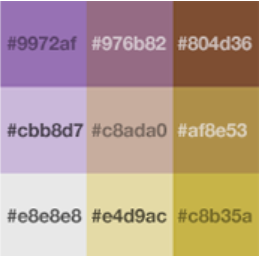

The bivariate key will be divided into 9 categories as follows:

*   high_high = #804d36
*   high_med = #af8e53
*   high_low = #c8b35a
*   med_high = #976b82
*   med_med = #c8ada0
*   med_low = #e4d9ac
*   low_high = #9972af
*   low_med = #cbb8d7
*   low_low = #e8e8e8

These categories will be used to represent the status of parcel lots in NYC as a contiuum of build-out. The latter will be based on the ratio of associated land:building(s) assessment values. 

For example, the "high_low" category represents a parcel with a high assessed value for land but very low assessed value for any building(s), indicating that the parcel is substantially underbuilt. 

Conversely, a property with "low_high" status is substantially overbuilt.

And properties with a "high_high" or "low_low" status have a level of buildout that is economically optimal for the property. 

The relative status of other build-out categories can be inferred on this basis. 


In [68]:

pallet = {

'high_high': '#804d36',
'high_med': '#af8e53',
'high_low': '#c8b35a',
'med_high': '#976b82',
'med_med': '#c8ada0',
'med_low': '#e4d9ac',
'low_high': '#9972af',
'low_med': '#cbb8d7',
'low_low': '#e8e8e8'}


Create function that will rank land and structure assessments based on their percentile values. For this purpose, I will establish three categories: "high", "med", "low"

In [66]:
# Assign category labels based on percentiles - dividing data set into thirds. 

def perc(x):

        if x > .66:
            return "high"

        elif x > .33:
            return "med"
        else:
            return "low"


Calculate percentile ranking for land and stucture assessments and save the calculations as dataframe variables. 

In [82]:
as2['per_land']=as2['assessland'].rank(pct=True)

as2['per_struct']=as2['assess_struct'].rank(pct=True)

as2.head()

          

,xcoord,ycoord,assessland,assess_struct,per_land,per_struct
1,987379.0,203535.0,359100.0,1713600.0,0.965683,0.973522
2,987653.0,205669.0,300150.0,814500.0,0.959792,0.946454
3,997831.0,203958.0,33753.0,816751.0,0.834726,0.946593
4,997331.0,236955.0,77400.0,1445400.0,0.885416,0.968739
5,1010138.0,237677.0,9600.0,30840.0,0.190800,0.346758


Assign rankings to land and structure assessments based on thier percentile scores. Save the results as new variables.

In [83]:
as2['land_rank']= [perc(x) for x in as2['per_land']]
as2['struct_rank'] = [perc(x) for x in as2['per_struct']]

as2.tail()


,xcoord,ycoord,assessland,assess_struct,per_land,per_struct,land_rank,struct_rank
858116,953140.0,167383.0,13140.0,20760.0,0.439133,0.091238,med,low
858119,954804.0,168819.0,15060.0,34680.0,0.545311,0.423069,med,med
858134,941996.0,166603.0,7260.0,25680.0,0.059898,0.224315,low,low
858152,967602.0,161739.0,18600.0,24120.0,0.679519,0.180638,high,low
858187,940394.0,136477.0,12660.0,41760.0,0.407456,0.545416,med,med


Combine land and structure rankings as combined categories. 


In [84]:
 as2['assess_rank'] = as2['land_rank'] + '_' + as2['struct_rank']

as2.head()

,xcoord,ycoord,assessland,assess_struct,per_land,per_struct,land_rank,struct_rank,assess_rank
1,987379.0,203535.0,359100.0,1713600.0,0.965683,0.973522,high,high,high_high
2,987653.0,205669.0,300150.0,814500.0,0.959792,0.946454,high,high,high_high
3,997831.0,203958.0,33753.0,816751.0,0.834726,0.946593,high,high,high_high
4,997331.0,236955.0,77400.0,1445400.0,0.885416,0.968739,high,high,high_high
5,1010138.0,237677.0,9600.0,30840.0,0.190800,0.346758,low,med,low_med


In [89]:
as2.dtypes

# we need to change our assess_rank variable to 'category' for subsequent 
#datashader mapping

as2.assess_rank= as2.assess_rank.astype('category')

In [90]:
as2.dtypes

xcoord            float64
ycoord            float64
assessland        float64
assess_struct     float64
per_land          float64
per_struct        float64
land_rank          object
struct_rank        object
assess_rank      category
dtype: object

Build a bivariate choropleth to evaluate underbuilt and overbuilt areas of New York City.

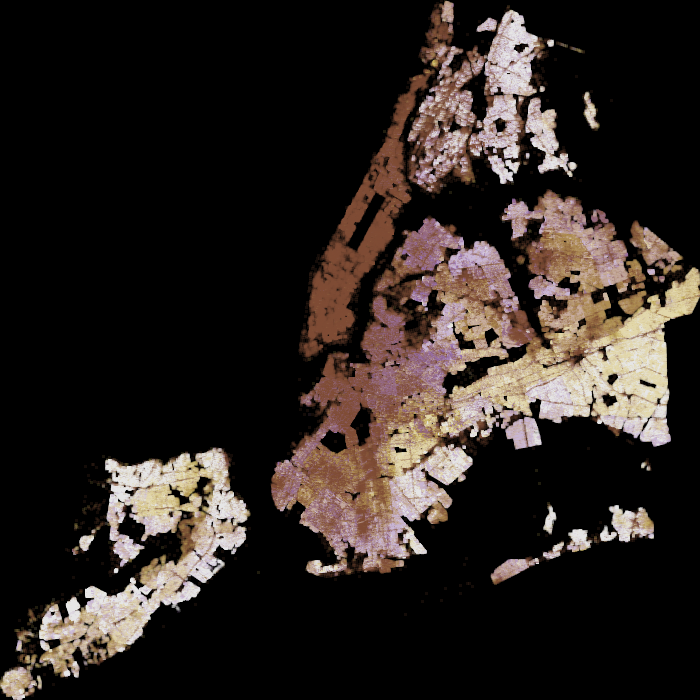

In [94]:
NewYorkCity   = (( 913164.0,  1067279.0), (120966.0, 272275.0))
cvs = ds.Canvas(700, 700, *NewYorkCity)
agg = cvs.points(as2, 'xcoord', 'ycoord', ds.count_cat('assess_rank'))
view = tf.shade(agg, color_key = pallet)
export(tf.spread(view, px=1),  'stevens')

Recall that underbuilt parcels are colored as follows:

image.png

Parcels that are overbuilt are colored as follows:

image.png

It is hard to differentiate buildout status at the parcel level at this scale. And I am relatively unfamiliary with the geography of NYC.

At a first approximation, however, it appears that there is a relatively high number of underbuilt parcels in Staten Island and parts of north-eastern Queens compared to other bourroughs. Areas that appear overbuilt the area around JFK airport and large portions of Brooklyn. 

Interestingly, buildout in Manhatten appears appropriately balanced in terms of assessed land:building values.

This graph might be improved by using a bivariate color scheme with greater contrast and/or a white background. As well as by rendering over-built and under-built parcels against other categories combined. 